In [1]:
from IPython.display import HTML


HTML("""<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

HTML('''<script src="https://cdnjs.cloudflare.com/ajax/libs/jquery/2.0.3/jquery.min.js "></script><script>
code_show=true; 
function code_toggle() {
if (code_show){
$('div.jp-CodeCell > div.jp-Cell-inputWrapper').hide();
} else {
$('div.jp-CodeCell > div.jp-Cell-inputWrapper').show();
}
code_show = !code_show
} 
$( document ).ready(code_toggle);</script><form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>
''')

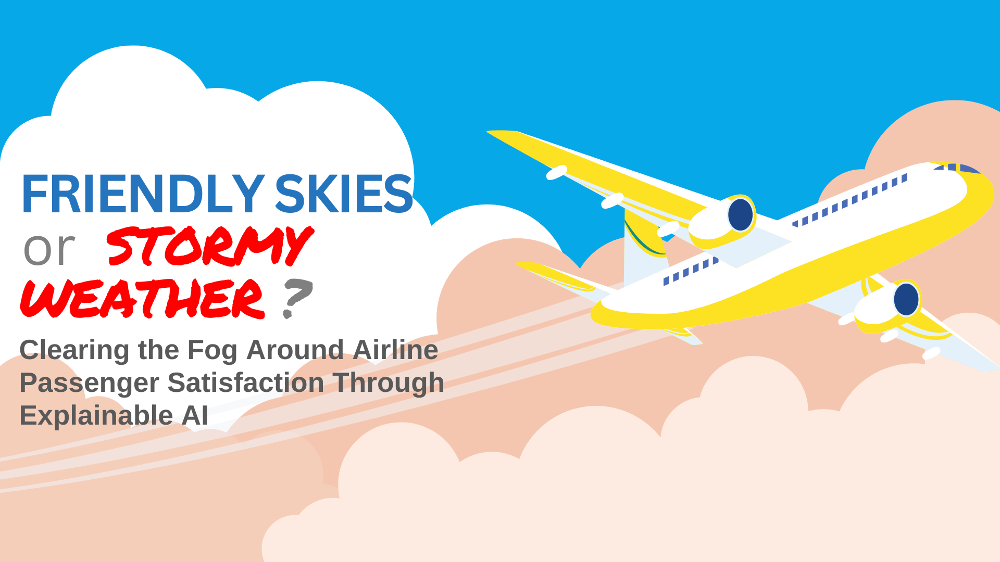

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import sqlite3 # Reading sql database
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as clr

# Predicting, metrics, etc
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report
from sklearn.utils import resample
from sklearn.model_selection import train_test_split, StratifiedKFold, GroupKFold, KFold
from sklearn.preprocessing import RobustScaler
from imblearn.pipeline import Pipeline
from interpret.glassbox import ExplainableBoostingClassifier
from sklearn.linear_model import LinearRegression
from sklearn.svm import LinearSVC
from tqdm import tqdm
from sklearn.model_selection import cross_val_score
from imblearn.over_sampling import SMOTE, ADASYN, SMOTENC
from sklearn.tree import DecisionTreeClassifier
from imblearn.combine import SMOTEENN
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import GridSearchCV, cross_validate
from sklearn.metrics import (accuracy_score,
                             recall_score, 
                             precision_score, f1_score)

from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())
from interpret import show

pd.set_option('display.max_columns', 1000)
pd.options.mode.chained_assignment = None  # default='warn'

import dice_ml
from dice_ml import Model, Dice, Data

# For Warnings
import warnings
warnings.filterwarnings("ignore")

sns.set_style({'axes.grid' : False})
sns.set_style('darkgrid')

#CSS CEBUPAC THEME
from IPython.core.display import HTML

custom_css = """
<style>
h1 {
    color: #2972bf; 
    background-color: #ffdf1e; 
    padding: 8px; 
    border-radius: 4px; 
}
h2 {
    color: #049481;
}
h3 {
    color: #2972bf;
}
h4 {
    color: #2475be;
}
/* Additional custom styles */
body {
    font-family: 'Arial', sans-serif;
}
div.text_cell_render { 
    font-size: 20px;
}
</style>
"""

HTML(custom_css)

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-lsga62fn because the default path (/home/jcodia/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [3]:
def get_RGB(N):
    c_list = []
    Yl = [255, 223, 30]
    Gr = [3, 149, 130]
    LB = [9, 165, 223]
    Rm1 = (Gr[0]-Yl[0])/(N/2)
    Rm2 = (LB[0]-Gr[0])/(N/2)
    Gm1 = (Gr[1]-Yl[1])/(N/2)
    Gm2 = (LB[1]-Gr[1])/(N/2)
    Bm1 = (Gr[2]-Yl[2])/(N/2)
    Bm2 = (LB[2]-Gr[2])/(N/2)
    for i in range(N):
        if (i<N/2):
            R = Yl[0] + Rm1*i
            G = Yl[1] + Gm1*i
            B = Yl[2] + Bm1*i
        else:
            R = Gr[0] + Rm2*(i-N/2)
            G = Gr[1] + Gm2*(i-N/2)
            B = Gr[2] + Bm2*(i-N/2)
        c_list.append((R/255, G/255, B/255))
    return [clr.rgb2hex(c) for c in c_list]

_colormap2 = ['#049481', '#15A7E0']
_colormap6 = get_RGB(6)
_colormap13 = get_RGB(13)

# EXECUTIVE SUMMARY

Airline passengers are the life and blood of the aviation industry, and passenger satisfaction is one of the top priorities airline businesses need to ensure their continued growth and success. In this study, we use the Explainable Boosting Machine to identify relevant features and extract key insights from US airline passenger data. The Explainable Boosting Machine is both a predictive model and an explainability model in one, and it can detect non-linear relationships such as interacting features. In addition to the global and local explanations provided by the Explainable Boosting Machine, we also use Diverse Counterfactual Explanations to provide passenger-level explanations. We identified three key features that determine passenger satisfaction based on global explanations, namely:

* In-flight wifi service,
* Passenger type, and
* Travel type.

To improve this study, we can perform a separate analysis on each travel type (business or personal) to obtain more granular insights on what each travel type customer finds important for their overall satisfaction. Since we successfully used the Explainable Boosting Machine to identify key features for passenger satisfaction, this model can also be used in industries that care about customer satisfaction.

# INTRODUCTION

## Background

Once upon a time, the sky was a bustling highway of planes soaring through the air, carrying adventurers and businesspeople alike to every corner of the globe. However, the sudden and catastrophic arrival of a global pandemic shook the world to its core, leaving the airline industry reeling and in dire straits.

As borders closed and people retreated into their homes, planes were grounded and flights were canceled. The once-bustling terminals of airports became ghost towns, and airlines were left facing financial ruin. But the industry wasn't ready to give up just yet.

Despite the setbacks, the airline industry remains determined to keep connecting people and places around the world. From cargo operations to new premium economy seats, carriers are finding innovative ways to generate revenue and entice passengers back to the skies.

In summary:
- Global flights decreased by 58% in 2020 but rose by 68% in 2022.
- US airline satisfaction went up by 27 points in 2020.
- Only 21% satisfied with luggage space. 
- Only 28% satisfied with food & beverage. [1][2][3]


## Problem Statement

What are the key factors influencing airline passenger satisfaction, and how can we implement effective strategies to convert dissatisfied customers into delighted ones?

## Motivation

In the aviation industry, flight delays are a relatively common occurrence. Many people have experienced this at some point in their lives, and if you are a frequent flyer, chances are, you have experienced this too.

According to the U.S. Department of Transportation, around 20% of flights in the United States were delayed in 2019, with an average delay time of 53 minutes. This means that a significant portion of air travelers have likely experienced a delayed flight at some point in their travels.

Flight delays however are only a single slice of the pie of customer satisfaction. Airline companies, since time immemorial, have been trying their hardest to improve the overall flight experience whilst not breaking the bank. But is customer satisfaction really that important?

Studies have shown that airline passenger satisfaction is crucial for the success and growth of the aviation industry. Satisfied passengers are more likely to become loyal paying customers, recommending the airline to family and friends, and returning for future flights. On the other hand, unsatisfied passengers are likely to become unloyal customers, spreading negative word of mouth, thus affecting the airline's reputation and future bookings.

Why do airlines strive to achieve high passenger satisfaction? To get that competitive edge! In today's highly competitive industry, airlines must differentiate themselves from countless competitors, and one effective way of doing so is by offering an extraordinary passenger experience.

# DATA SOURCE

This dataset contains an airline passenger satisfaction survey.

Link: https://www.kaggle.com/datasets/teejmahal20/airline-passenger-satisfaction

|<center>Column Name</center>|<center>Description</center>|
|:-------------------|:----------------------|
| Gender | Gender of the passengers (Female, Male) |
| Customer Type | The customer type (Loyal customer, disloyal customer) |
| Age | The actual age of the passengers |
| Type of Travel | Purpose of the flight of the passengers (Personal Travel, Business Travel) |
| Class | Travel class in the plane of the passengers (Business, Eco, Eco Plus) |
| Flight distance | The flight distance of this journey |
| Inflight wifi service | Satisfaction level of the inflight wifi service (0:Not Applicable;1-5) |
| Departure/Arrival time convenient | Satisfaction level of Departure/Arrival time convenient |
| Ease of Online booking | Satisfaction level of online booking |
| Gate location | Satisfaction level of Gate location |
| Food and drink | Satisfaction level of Food and drink |
| Online boarding | Satisfaction level of online boarding |
| Seat comfort | Satisfaction level of Seat comfort |
| Inflight entertainment | Satisfaction level of inflight entertainment |
| On-board service | Satisfaction level of On-board service |
| Leg room service | Satisfaction level of Leg room service |
| Baggage handling | Satisfaction level of baggage handling |
| Check-in service | Satisfaction level of Check-in service |
| Inflight service | Satisfaction level of inflight service |
| Cleanliness | Satisfaction level of Cleanliness |
| Departure Delay in Minutes | Minutes delayed when departure |
| Arrival Delay in Minutes | Minutes delayed when Arrival |
| Satisfaction | Airline satisfaction level(Satisfaction, neutral or dissatisfaction) |

Note: This data set was modified from this dataset by **John D** <a href=https://www.kaggle.com/datasets/johndddddd/customer-satisfaction>here</a>. It has been initially cleaned up by **TJ KLEIN** for the purposes of classification.

# METHODOLOGY

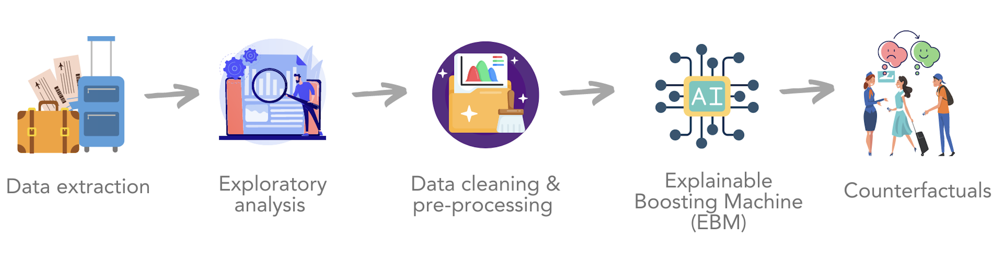

1. Data Extraction
 - Extract data from data source: 2015 US Airline Passenger Satisfaction
2. Exploratory Analysis
 - Perform null value imputation
 - Identify the statistics for each feature
 - Identify the class distribution for each feature
3. Data Cleaning & Preprocessing
 - Remap values to a categorical variable
 - Drop unnecessary columns
 - Filter to economy class only
 - Binarize Targets
4. Machine Learning Pipeline
 - Train-test split
 - SMOTENC to address class imbalance (Only on the train set)
 - Hyperparameter Tuning
 - Cross Validation
5. Explainability Pipeline
 - Explainable Boosting Machine (EBM) Global Explanation
 - Explainable Boosting Machine (EBM) Local Explanation
 - DiCE Counterfactuals

In [4]:
airline_path = 'test.csv'
df_airline = pd.read_csv(airline_path, index_col='id').drop('Unnamed: 0', axis=1)
df_airline = df_airline.loc[df_airline.Class == 'Eco']
# df_airline = df_airline.drop(['Gender', 'Customer Type', 'Age', 'Class', 'Type of Travel'], axis=1)
df_airline = df_airline.drop(['Class'], axis=1)
df_airline.loc[df_airline.satisfaction == 'satisfied', "satisfaction"] = 1
df_airline.loc[df_airline.satisfaction == 'neutral or dissatisfied', "satisfaction"] = 0
df_airline['satisfaction'] = df_airline['satisfaction'].astype(int)
df_final = df_airline.dropna()

<center>'pandas.core.frame.DataFrame'<br>
Int64Index: 11524 entries, 19556 to 34799<br>
Data columns (total 22 columns):</center>
    
|<center>No.</center>|<center>Column</center>|<center>Count</center>|<center>Non-Null</center>|<center>Dtype</center>|
|:-------------------|:----------------------|:---------------------|:------------------------|:---------------------| 
| 0  | Gender                            | 11524 | non-null | object  |
| 1  | Customer Type                     | 11524 | non-null | object  |
| 2  | Age                               | 11524 | non-null | int64   |
| 3  | Type of Travel                    | 11524 | non-null | object  |
| 4  | Flight Distance                   | 11524 | non-null | int64   |
| 5  | Inflight wifi service             | 11524 | non-null | int64   |
| 6  | Departure/Arrival time convenient | 11524 | non-null | int64   |
| 7  | Ease of Online booking            | 11524 | non-null | int64   |
| 8  | Gate location                     | 11524 | non-null | int64   |
| 9  | Food and drink                    | 11524 | non-null | int64   |
| 10 | Online boarding                   | 11524 | non-null | int64   |
| 11 | Seat comfort                      | 11524 | non-null | int64   |
| 12 | Inflight entertainment            | 11524 | non-null | int64   |
| 13 | On-board service                  | 11524 | non-null | int64   |
| 14 | Leg room service                  | 11524 | non-null | int64   |
| 15 | Baggage handling                  | 11524 | non-null | int64   |
| 16 | Checkin service                   | 11524 | non-null | int64   |
| 17 | Inflight service                  | 11524 | non-null | int64   |
| 18 | Cleanliness                       | 11524 | non-null | int64   |
| 19 | Departure Delay in Minutes        | 11524 | non-null | int64   |
| 20 | Arrival Delay in Minutes          | 11524 | non-null | float64 |
| 21 | satisfaction                      | 11524 | non-null | int32   |

<center>dtypes: float64(1), int32(1), int64(17), object(3)<br>
memory usage: 2.0+ MB</center>

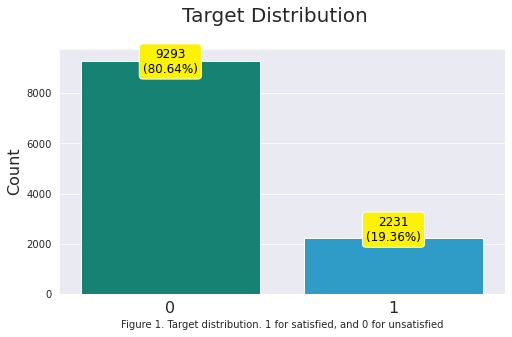

In [5]:
df_count = df_final['satisfaction'].value_counts()

fig, axes = plt.subplots(1, 1, figsize=(8, 4.5))
ax = sns.barplot(y=df_count, x=df_count.index, palette=_colormap2)
ax.set_ylabel('Count', size=16)
ax.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle('Target Distribution',
             fontsize=20, y=1.01)

_n = sum(df_count.values)
for i, val in enumerate(df_count.values):
    ax.text(i, val*0.95, (f'{val}\n({(val/_n*100).round(2)}%)'), color='black', ha='center', 
            bbox=dict(boxstyle='round', facecolor='#fbf205'), fontsize=12)
ax.set_xlabel('Figure 1. Target distribution. 1 for satisfied, and 0 for unsatisfied')
plt.show()

In [6]:
pcc = ((df_final['satisfaction'].value_counts() / df_final.shape[0]) ** 2).sum().round(2)
print(f"PCC:         {pcc}")
print(f"1.25 x PCC:  {(pcc*1.25):.2f}")

PCC:         0.69
1.25 x PCC:  0.86


With approximately 19% of the dataset belonging to unsatisfied class, the distribution of the target variable is imbalanced. We have a moderate degree of imbalance.

A PCC of 0.69 means that the model can easily achieve a 69% prediction performance by random chance alone. The target 1.25×PCC baseline of the dataset means that the model must achieve an accuracy higher than 86% to be considered performing better than random guessing.

# EXPLORATORY DATA ANALYSIS

## Categorical

In [7]:
df_final.head(3)

,Gender,Customer Type,Age,Type of Travel,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
id,,,,,,,,,,,,,,,,,,,,,,
19556,Female,Loyal Customer,52,Business travel,160,5,4,3,4,3,4,3,5,5,5,5,2,5,5,50,44.0,1
12360,Male,disloyal Customer,20,Business travel,192,2,0,2,4,2,2,2,2,4,1,3,2,2,2,0,0.0,0
36875,Female,Loyal Customer,49,Business travel,1182,2,3,4,3,4,1,2,2,2,2,2,4,2,4,0,20.0,1


<b>Gender</b> is approximately equally distributed between air passengers. The approximately equal distribution highlights the importance of considering all travelers' diverse needs and preferences when designing and offering airline services. By acknowledging and addressing the varied expectations of both male and female passengers, airlines can create a more inclusive and enjoyable travel experience, ultimately leading to increased customer satisfaction and loyalty.

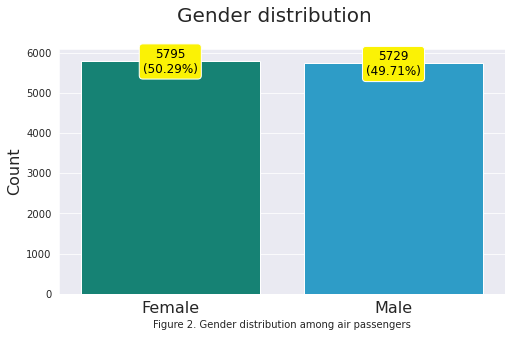

In [8]:
df_count = df_final.Gender.value_counts()

fig, axes = plt.subplots(1, 1, figsize=(8, 4.5))
ax = sns.barplot(y=df_count, x=df_count.index, palette=_colormap2)
ax.set_ylabel('Count', size=16)
ax.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle('Gender distribution',
             fontsize=20, y=1.01)

_n = sum(df_count.values)
for i, val in enumerate(df_count.values):
    ax.text(i, val*0.95, (f'{val}\n({(val/_n*100).round(2)}%)'), color='black', ha='center', 
            bbox=dict(boxstyle='round', facecolor='#fbf205'), fontsize=12)
ax.set_xlabel('Figure 2. Gender distribution among air passengers')
plt.show()

<b>76.44%</b> of frequent flyers are loyal customers. Since a significant majority of people who fly regularly tend to consistently choose the same airline or service provider, possibly due to factors such as brand loyalty, satisfaction with the service, membership in a rewards program, or other benefits and incentives. Such customer behavior also suggests that the airline or service provider effectively retains customers and that customer retention strategies may be working well.

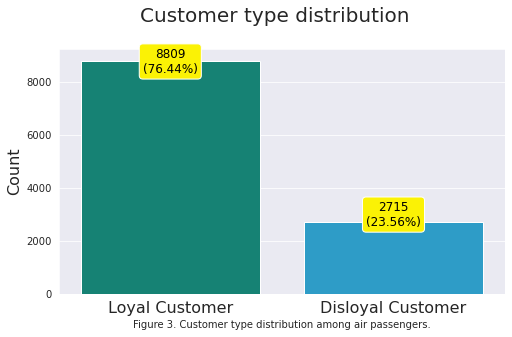

In [9]:
_df = df_final['Customer Type'].apply(lambda x: 'Disloyal Customer' 
                                      if x == 'disloyal Customer' else x)

df_count = _df.value_counts()

fig, axes = plt.subplots(1, 1, figsize=(8, 4.5))
ax = sns.barplot(y=df_count, x=df_count.index, palette=_colormap2)
ax.set_ylabel('Count', size=16)
ax.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle('Customer type distribution',
             fontsize=20, y=1.01)

_n = sum(df_count.values)
for i, val in enumerate(df_count.values):
    ax.text(i, val*0.95, (f'{val}\n({(val/_n*100).round(2)}%)'), color='black', ha='center', 
            bbox=dict(boxstyle='round', facecolor='#fbf205'), fontsize=12)

ax.set_xlabel('Figure 3. Customer type distribution among air passengers.')
plt.show()

<b>43.64%</b> of air passengers travel for business reasons. It suggests that many air passengers fly for work, attend meetings, conferences, or other professional events. This information is vital for airlines and other stakeholders in the travel industry, since they can use this information to better understand their customer base and tailor their services and offerings to cater to the needs of business travelers.

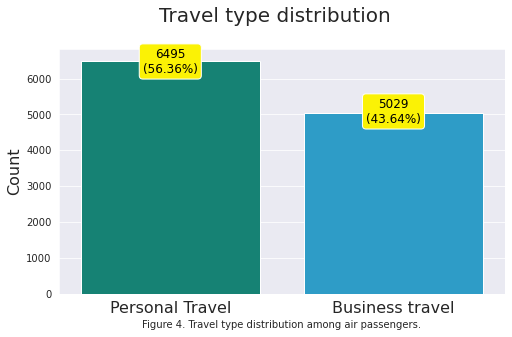

In [10]:
df_count = df_final['Type of Travel'].value_counts()

fig, axes = plt.subplots(1, 1, figsize=(8, 4.5))
ax = sns.barplot(y=df_count, x=df_count.index, palette=_colormap2)
ax.set_ylabel('Count', size=16)
ax.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle('Travel type distribution',
             fontsize=20, y=1.01)

_n = sum(df_count.values)
for i, val in enumerate(df_count.values):
    ax.text(i, val*0.95, (f'{val}\n({(val/_n*100).round(2)}%)'), color='black', ha='center', 
            bbox=dict(boxstyle='round', facecolor='#fbf205'), fontsize=12)

ax.set_xlabel('Figure 4. Travel type distribution among air passengers.')
plt.show()

Only <b>20%</b> of customers are satisfied with their flights. It is concerning that only 20% of customers are satisfied with their flights, which suggests significant room for improvement in the airline industry. This dissatisfaction may be a result of factors such as delays, uncomfortable seating, poor customer service, or high prices.

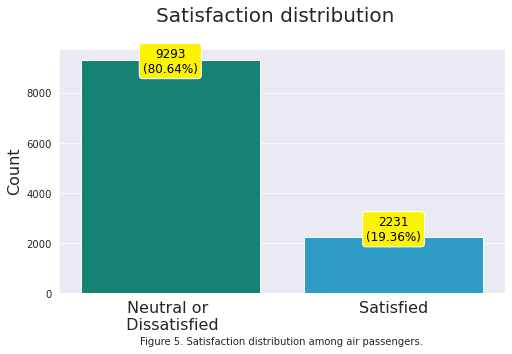

In [11]:
_df = df_final['satisfaction'].apply(lambda x: 'Satisfied' 
                                     if x==1 else 'Neutral or \n Dissatisfied')
df_count = _df.value_counts()

fig, axes = plt.subplots(1, 1, figsize=(8, 4.5))
ax = sns.barplot(y=df_count, x=df_count.index, palette=_colormap2)
ax.set_ylabel('Count', size=16)
ax.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle('Satisfaction distribution',
             fontsize=20, y=1.01)

_n = sum(df_count.values)
for i, val in enumerate(df_count.values):
    ax.text(i, val*0.95, (f'{val}\n({(val/_n*100).round(2)}%)'), color='black', ha='center', 
            bbox=dict(boxstyle='round', facecolor='#fbf205'), fontsize=12)

ax.set_xlabel('Figure 5. Satisfaction distribution among air passengers.')
plt.show()

## Numerical

The seemingly bimodal age distribution among air passengers, with a noticeable decline in travelers past their 70s, reveals two prominent age groups (20s, 40s) dominating the airline industry. This pattern highlights the importance of understanding and addressing these two customer segments' distinct needs, preferences, and expectations to create tailored travel experiences that cater to their specific requirements. By doing so, airlines can enhance passenger satisfaction and foster long-term loyalty within these key demographics.

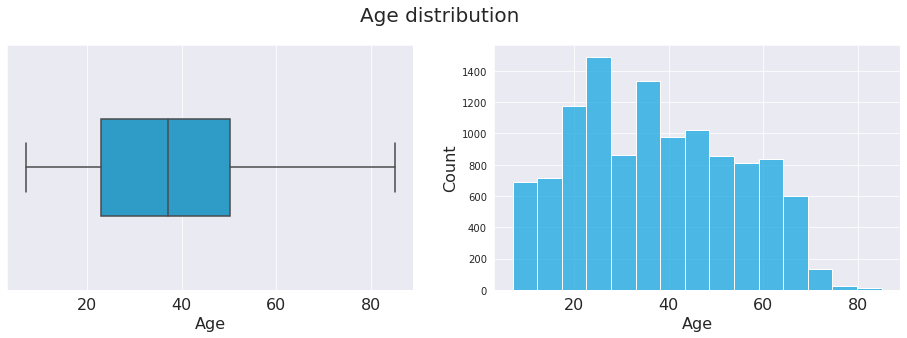

In [12]:
df_count = df_final.Age

['#15A7E0', '#119584']

fig, axes = plt.subplots(1, 2, figsize=(16, 4.5))
ax1 = sns.histplot(df_count, bins=15, ax=axes[1], color='#15A7E0')
ax2 = sns.boxplot(df_count, ax=axes[0], color='#15A7E0', width=0.4)
ax1.set_xlabel('Age', size=16)
ax2.set_xlabel('Age', size=16)
ax1.set_ylabel('Count', size=16)
ax1.tick_params(axis='x', which='major', labelsize=16)
ax2.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle('Age distribution',
             fontsize=20, y=1)
ax.set_xlabel('Figures 6 and 7. Age boxplot and distribution among air passengers')
plt.show()

<center>Figures 6 and 7. Age boxplot and distribution among air passengers</center>

The flight distance seems to follow a **skewed normal distribution**, with very few people flying more than 2,000 km, indicating that most air passengers are taking shorter flights, likely for domestic or regional travel. This insight suggests that airlines should optimize their services and amenities for shorter flights, ensuring that passengers have a comfortable and efficient experience. By catering to the needs of passengers on these more frequent, shorter journeys, airlines can improve customer satisfaction and strengthen their market position in the domestic and regional sectors.

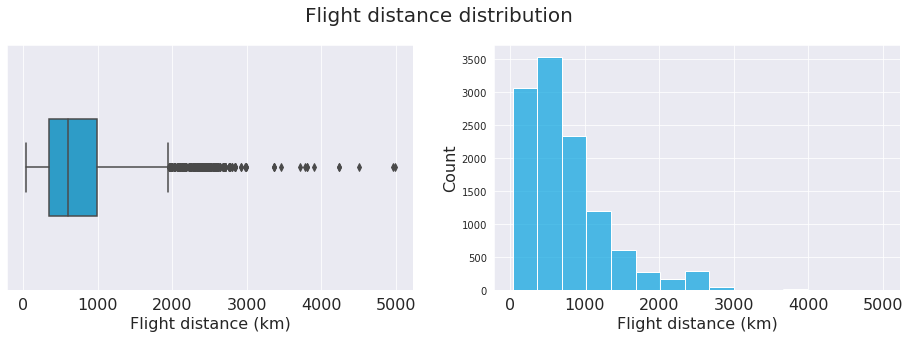

In [13]:
df_count = df_final['Flight Distance']

fig, axes = plt.subplots(1, 2, figsize=(16, 4.5))
ax1 = sns.histplot(df_count, bins=15, ax=axes[1], color='#15A7E0')
ax2 = sns.boxplot(df_count, ax=axes[0], color='#15A7E0', width=0.4)
ax1.set_xlabel('Flight distance (km)', size=16)
ax2.set_xlabel('Flight distance (km)', size=16)
ax1.set_ylabel('Count', size=16)
ax1.tick_params(axis='x', which='major', labelsize=16)
ax2.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle('Flight distance distribution',
             fontsize=20, y=1)
plt.show()

<center>Figures 8 and 9. Flight distance boxplot and distribution among air passengers</center>

Most delayed flights are **mostly delayed by at most 2 hours**, with very few cases going beyond that, implying that most flight delays are relatively short. This insight suggests that airlines should focus on effective communication and swift resolution of these short-term delays to minimize passenger inconvenience. By providing timely updates and clear information regarding the cause and expected duration of the delay, airlines can maintain customer satisfaction and trust, even during unforeseen disruptions to their schedules.

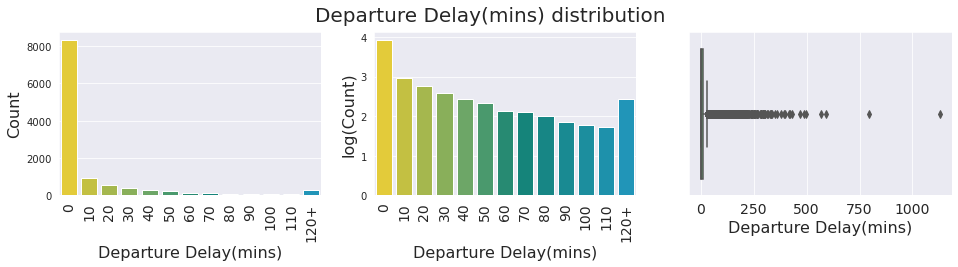

In [14]:
_df = df_final['Departure Delay in Minutes'].apply(lambda x: x if x<130 else 130)
_freq, _bins = np.histogram(_df, bins=13)
_bins = list(map(lambda x: '120+' if x==120 else int(x), _bins[:-1]))
_logfreq = np.log10(_freq)

fig, axes = plt.subplots(1, 3, figsize=(16, 3))

ax1 = sns.barplot(y=_freq, x=_bins, palette=_colormap13, ax=axes[0])
ax2 = sns.barplot(y=_logfreq, x=_bins, palette=_colormap13, ax=axes[1])
ax3 = sns.boxplot(df_final['Departure Delay in Minutes'], ax=axes[2], color='#55C667FF')
ax1.set_xlabel('Departure Delay(mins)', size=16)
ax2.set_xlabel('Departure Delay(mins)', size=16)
ax3.set_xlabel('Departure Delay(mins)', size=16)
ax1.set_ylabel('Count', size=16)
ax2.set_ylabel('log(Count)', size=16)
ax1.tick_params(axis='x', which='major', labelsize=14, rotation=90)
ax2.tick_params(axis='x', which='major', labelsize=14, rotation=90)
ax3.tick_params(axis='x', which='major', labelsize=14)
fig.suptitle('Departure Delay(mins) distribution',
             fontsize=20, y=1)
plt.show()

<center>Figures 10, 11 and 12. Departure delay distribution (and log transformed) and boxplot among air passengers</center>

The distributions of departure delay and arrival delay are very similar. The small changes accounts for the delays in landing caused by congested runways. This insight may indicate that the primary factors causing delays are generally consistent throughout the flight process. This also suggests that airlines should address these common factors to improve overall punctuality and minimize delays. Airlines can streamline operations, collaborate with airport authorities to manage congestion, and optimize scheduling which can enhance the travel experience for passengers by reducing delays and ensuring timely arrivals and departures.

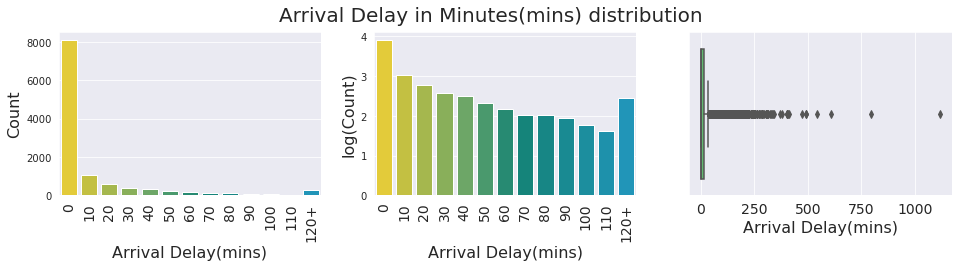

In [15]:
_df = df_final['Arrival Delay in Minutes'].apply(lambda x: x if x<130 else 130)
_freq, _bins = np.histogram(_df, bins=13)
_bins = list(map(lambda x: '120+' if x==120 else int(x), _bins[:-1]))
_logfreq = np.log10(_freq)

fig, axes = plt.subplots(1, 3, figsize=(16, 3))

ax1 = sns.barplot(y=_freq, x=_bins, palette=_colormap13, ax=axes[0])
ax2 = sns.barplot(y=_logfreq, x=_bins, palette=_colormap13, ax=axes[1])
ax3 = sns.boxplot(df_final['Arrival Delay in Minutes'], ax=axes[2], color='#55C667FF')
ax1.set_xlabel('Arrival Delay(mins)', size=16)
ax2.set_xlabel('Arrival Delay(mins)', size=16)
ax3.set_xlabel('Arrival Delay(mins)', size=16)
ax1.set_ylabel('Count', size=16)
ax2.set_ylabel('log(Count)', size=16)
ax1.tick_params(axis='x', which='major', labelsize=14, rotation=90)
ax2.tick_params(axis='x', which='major', labelsize=14, rotation=90)
ax3.tick_params(axis='x', which='major', labelsize=14)
fig.suptitle('Arrival Delay in Minutes(mins) distribution',
             fontsize=20, y=1)
plt.show()

<center>Figures 13, 14 and 15. Arrival delay distribution (and log transformed) and boxplot among air passengers</center>

Majority of passengers **rated departure/arrival time well**. This insight reveals that passengers care about arriving and departing on time, and most of them seem to be happy with how airlines are managing this. This shows how important it is for airlines to be punctual and keep delays to a minimum throughout the entire flight process. By prioritizing timely arrivals and departures, airlines can make sure passengers have a good experience and feel satisfied with their travel.

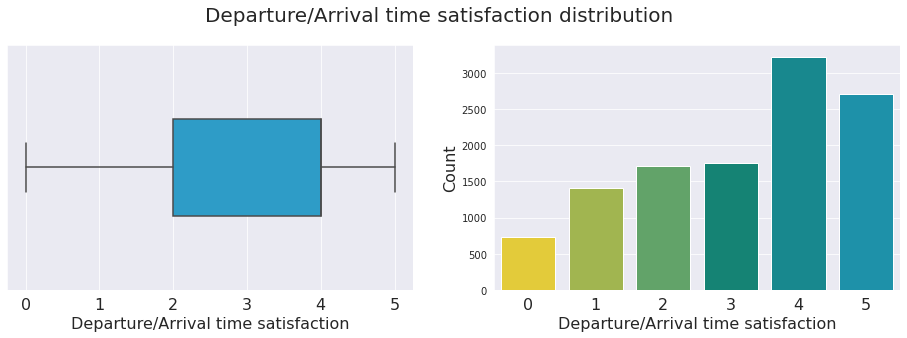

In [16]:
df_count = df_final['Departure/Arrival time convenient'].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(16, 4.5))
ax1 = sns.barplot(y=df_count, x=df_count.index, palette=_colormap6,
                  ax=axes[1])
ax3 = sns.boxplot(df_final['Departure/Arrival time convenient'], ax=axes[0], 
                  color='#15A7E0', width=0.4)
ax1.set_ylabel('Count', size=16)
ax1.set_xlabel('Departure/Arrival time satisfaction', size=16)
ax3.set_xlabel('Departure/Arrival time satisfaction', size=16)
ax1.tick_params(axis='x', which='major', labelsize=16)
ax3.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle('Departure/Arrival time satisfaction distribution',
             fontsize=20, y=1)
plt.show()

<center>Figures 16 and 17. Departure/Arrival time satisfaction boxplot and distribution among air passengers</center>

A significant number of passengers **rated in-flight Wi-Fi services poorly**. The rating of **0 corresponds to "not applicable"**. Considering also that 43.64% of air passengers travel for business reasons, it becomes even more crucial for airlines to improve the quality and availability of their Wi-Fi services. This insight highlights the growing demand for reliable connectivity during flights, as passengers, especially business travelers, increasingly expect to stay connected for work or personal reasons while on board. Reliable in-flight connectivity is essential for business travelers, as they often need to access emails, work on presentations, or attend virtual meetings while on board.

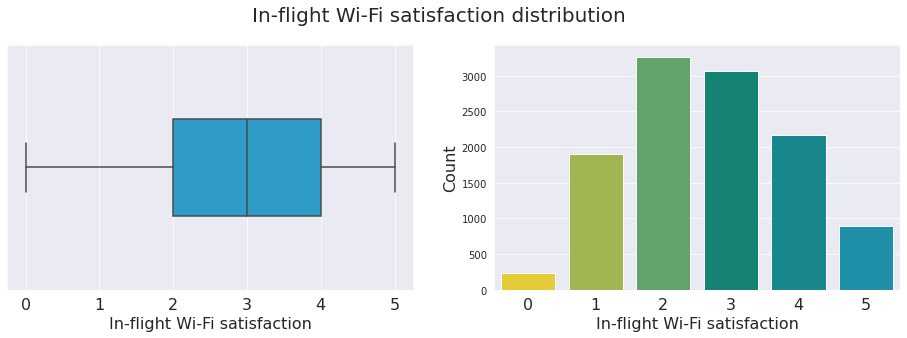

In [17]:
df_count = df_final['Inflight wifi service'].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(16, 4.5))
ax1 = sns.barplot(y=df_count, x=df_count.index, palette=_colormap6,
                  ax=axes[1])
ax3 = sns.boxplot(df_final['Inflight wifi service'], ax=axes[0], 
                  color='#15A7E0', width=0.4)
ax1.set_ylabel('Count', size=16)
ax1.set_xlabel('In-flight Wi-Fi satisfaction', size=16)
ax3.set_xlabel('In-flight Wi-Fi satisfaction', size=16)
ax1.tick_params(axis='x', which='major', labelsize=16)
ax3.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle('In-flight Wi-Fi satisfaction distribution', fontsize=20, y=1)
plt.show()

<center>Figures 18 and 19. In-flight Wi-Fi boxplot and distribution among air passengers</center>

A significant number of passengers **rated online booking poorly**. Many passengers seem unhappy with the online booking process, which is a problem for airlines. This shows how important it is for airlines to make booking flights online easy and user-friendly. It's becoming increasingly common for people to book their flights online, so airlines need to make sure their booking systems are modern, easy to use, and provide all the information passengers need.

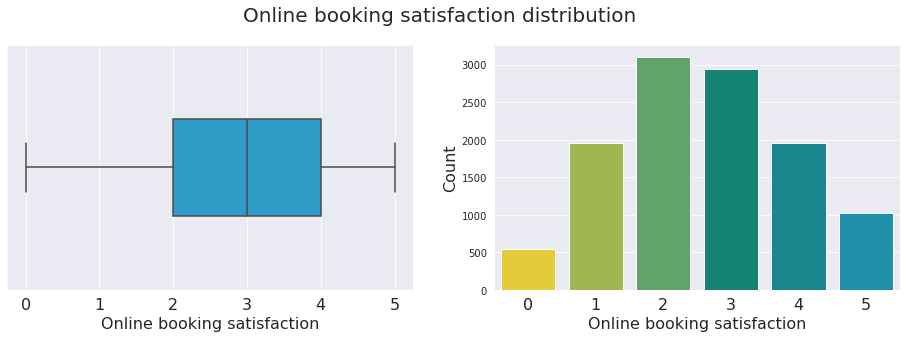

In [18]:
df_count = df_final['Ease of Online booking'].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(16, 4.5))
ax1 = sns.barplot(y=df_count, x=df_count.index, palette=_colormap6,
                  ax=axes[1])
ax3 = sns.boxplot(df_final['Ease of Online booking'], ax=axes[0], 
                  color='#15A7E0', width=0.4)
ax1.set_ylabel('Count', size=16)
ax1.set_xlabel('Online booking satisfaction', size=16)
ax3.set_xlabel('Online booking satisfaction', size=16)
ax1.tick_params(axis='x', which='major', labelsize=16)
ax3.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle('Online booking satisfaction distribution',
             fontsize=20, y=1)
plt.show()

<center>Figures 20 and 21. Online booking satisfaction boxplot and distribution among air passengers</center>

A significant number of passengers feel neutral about gate location. Many passengers don't care too much about the gate location, so airlines don't need to worry as much as they might think. While some passengers may have specific preferences about where they want to board, it seems like a lot of people are pretty flexible. This insight shows that airlines can focus their efforts on other areas that have a bigger impact on customer satisfaction.

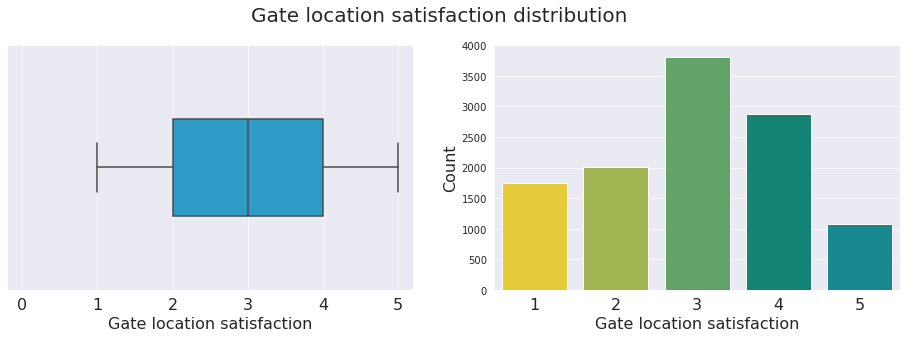

In [19]:
_feat = 'Gate location'
df_count = df_final[_feat].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(16, 4.5))
ax1 = sns.barplot(y=df_count, x=df_count.index, palette=_colormap6,
                  ax=axes[1])
ax3 = sns.boxplot(df_final[_feat], ax=axes[0], 
                  color='#15A7E0', width=0.4)
ax1.set_ylabel('Count', size=16)
ax1.set_xlabel(f'{_feat} satisfaction', size=16)
ax3.set_xlabel(f'{_feat} satisfaction', size=16)
ax1.tick_params(axis='x', which='major', labelsize=16)
ax3.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle(f'{_feat} satisfaction distribution',
             fontsize=20, y=1)
ax3.set_xlim(xmin=-0.2)
plt.show()

<center>Figures 22 and 23. Gate location satisfaction boxplot and distribution among air passengers</center>

Passengers have **mixed feelings about in-flight food and drink**, which means airlines must improve the quality and variety of their meal options. This insight shows how important it is for airlines to offer meals that cater to different dietary needs and tastes and that are also affordable.

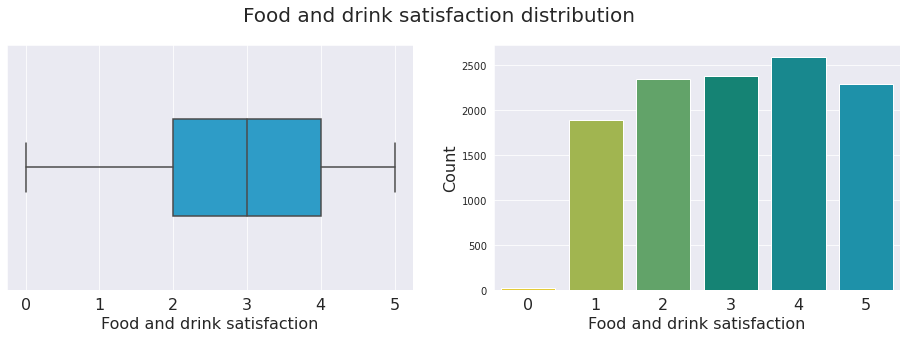

In [20]:
_feat = 'Food and drink'
df_count = df_final[_feat].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(16, 4.5))
ax1 = sns.barplot(y=df_count, x=df_count.index, palette=_colormap6,
                  ax=axes[1])
ax3 = sns.boxplot(df_final[_feat], ax=axes[0], 
                  color='#15A7E0', width=0.4)
ax1.set_ylabel('Count', size=16)
ax1.set_xlabel(f'{_feat} satisfaction', size=16)
ax3.set_xlabel(f'{_feat} satisfaction', size=16)
ax1.tick_params(axis='x', which='major', labelsize=16)
ax3.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle(f'{_feat} satisfaction distribution',
             fontsize=20, y=1)
plt.show()

<center>Figures 24 and 25. Food and drink satisfaction boxplot and distribution among air passengers</center>

Passengers have **mixed feelings about online boarding**. This insight shows how important it is for airlines to provide a hassle-free check-in experience for passengers who may want to avoid long lines at the airport. We all know how frustrating it can be to wait in a queue, especially when we're excited to start our journeys. So, airlines should consider investing in modern online check-in systems that make it easy and convenient for passengers to check-in before they even arrive at the airport.

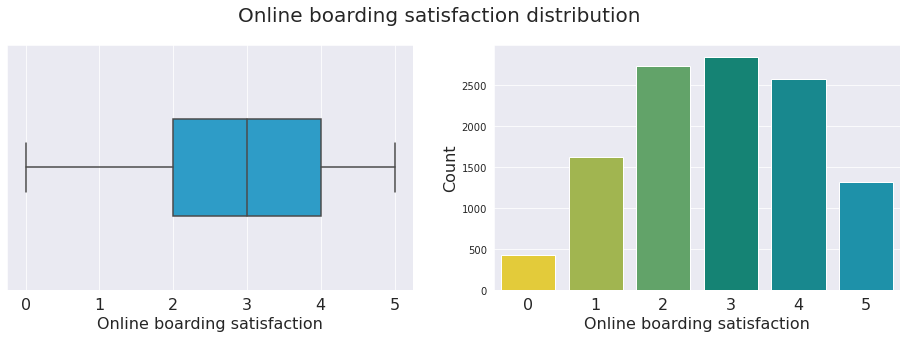

In [21]:
_feat = 'Online boarding'
df_count = df_final[_feat].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(16, 4.5))
ax1 = sns.barplot(y=df_count, x=df_count.index, palette=_colormap6,
                  ax=axes[1])
ax3 = sns.boxplot(df_final[_feat], ax=axes[0], 
                  color='#15A7E0', width=0.4)
ax1.set_ylabel('Count', size=16)
ax1.set_xlabel(f'{_feat} satisfaction', size=16)
ax3.set_xlabel(f'{_feat} satisfaction', size=16)
ax1.tick_params(axis='x', which='major', labelsize=16)
ax3.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle(f'{_feat} satisfaction distribution',
             fontsize=20, y=1)
plt.show()

<center>Figures 26 and 27. Online boarding satisfaction boxplot and distribution among air passengers</center>

A significant number of passengers **rated seat comfort well**. This insight shows that passengers care about their seat comfort while flying. It's no surprise - sitting in a cramped and uncomfortable seat for hours can really put a damper on the whole travel experience. So, airlines must prioritize offering comfortable seating options that help passengers feel relaxed and at ease during their flights.

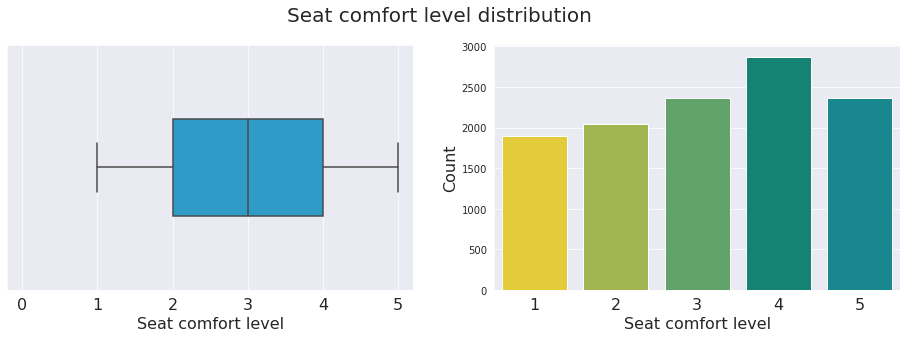

In [22]:
df_count = df_final['Seat comfort'].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(16, 4.5))
ax1 = sns.barplot(y=df_count, x=df_count.index, palette=_colormap6,
                  ax=axes[1])
ax3 = sns.boxplot(df_final['Seat comfort'], ax=axes[0], 
                  color='#15A7E0', width=0.4)
ax1.set_ylabel('Count', size=16)
ax1.set_xlabel('Seat comfort level', size=16)
ax3.set_xlabel('Seat comfort level', size=16)
ax1.tick_params(axis='x', which='major', labelsize=16)
ax3.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle('Seat comfort level distribution',
             fontsize=20, y=1)
ax3.set_xlim(xmin=-0.2)
plt.show()

<center>Figures 28 and 29. Seat combort level boxplot and distribution among air passengers</center>

Passengers have **mixed feelings about leg room**. This insight shows that passengers have different opinions when it comes to legroom on flights. Some passengers might be fine with less space, while others might want more room to stretch their legs. This makes it important for airlines to provide seating options that cater to everyone's needs and preferences.

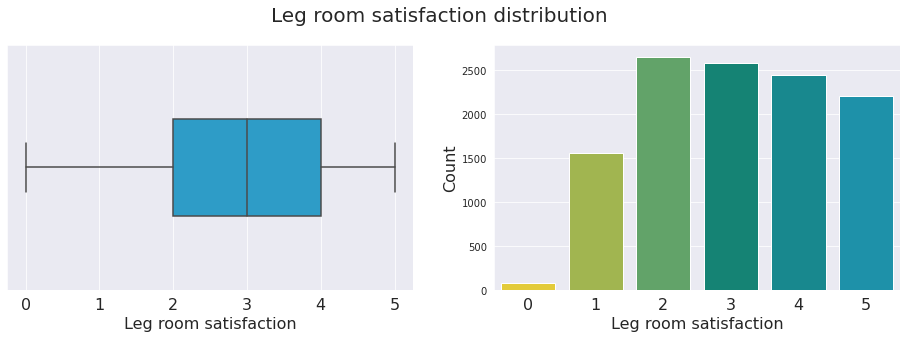

In [23]:
df_count = df_final['Leg room service'].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(16, 4.5))
ax1 = sns.barplot(y=df_count, x=df_count.index, palette=_colormap6,
                  ax=axes[1])
ax3 = sns.boxplot(df_final['Leg room service'], ax=axes[0], 
                  color='#15A7E0', width=0.4)
ax1.set_ylabel('Count', size=16)
ax1.set_xlabel('Leg room satisfaction', size=16)
ax3.set_xlabel('Leg room satisfaction', size=16)
ax1.tick_params(axis='x', which='major', labelsize=16)
ax3.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle('Leg room satisfaction distribution',
             fontsize=20, y=1)
plt.show()

<center>Figures 30 and 31. Leg room satisfaction boxplot and distribution among air passengers</center>

Passengers have **mixed feelings about in-flight entertainment**. Paired with earlier insight on in-flight Wi-Fi, this insight shows that passengers want to stay connected and entertained during their flight but are not always satisfied with the options available. For some, in-flight Wi-Fi might be a must-have, while for others, in-flight entertainment is what they're looking for. But regardless of what passengers want, airlines need to step up their game and provide reliable, high-quality options to keep their customers happy.

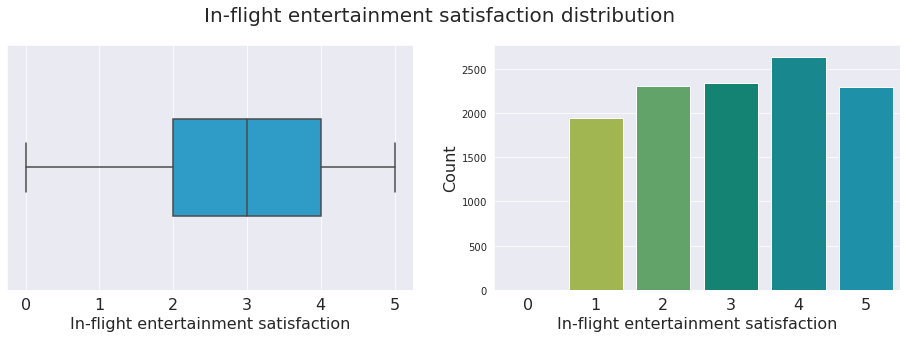

In [24]:
_feat = 'Inflight entertainment'
df_count = df_final[_feat].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(16, 4.5))
ax1 = sns.barplot(y=df_count, x=df_count.index, palette=_colormap6,
                  ax=axes[1])
ax3 = sns.boxplot(df_final[_feat], ax=axes[0], 
                  color='#15A7E0', width=0.4)
ax1.set_ylabel('Count', size=16)
ax1.set_xlabel(f'In-flight entertainment satisfaction', size=16)
ax3.set_xlabel(f'In-flight entertainment satisfaction', size=16)
ax1.tick_params(axis='x', which='major', labelsize=16)
ax3.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle(f'In-flight entertainment satisfaction distribution',
             fontsize=20, y=1)
plt.show()

<center>Figures 32 and 33. In-flight entertainment satisfaction boxplot and distribution among air passengers</center>

A significant number of passengers **rated on-board services well**. This insight indicate that passengers appreciate high-quality on-board services during their flight. From comfortable seating to delicious meals and engaging entertainment options, airlines need to focus on providing an enjoyable and relaxing in-flight experience for their customers.

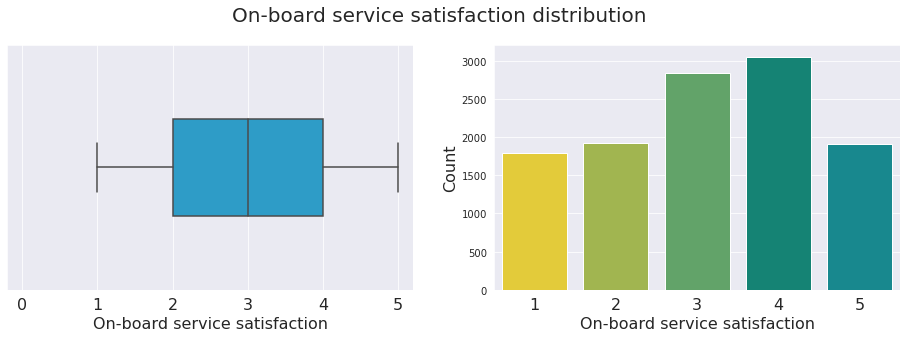

In [25]:
_feat = 'On-board service'
df_count = df_final[_feat].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(16, 4.5))
ax1 = sns.barplot(y=df_count, x=df_count.index, palette=_colormap6,
                  ax=axes[1])
ax3 = sns.boxplot(df_final[_feat], ax=axes[0], 
                  color='#15A7E0', width=0.4)
ax1.set_ylabel('Count', size=16)
ax1.set_xlabel(f'{_feat} satisfaction', size=16)
ax3.set_xlabel(f'{_feat} satisfaction', size=16)
ax1.tick_params(axis='x', which='major', labelsize=16)
ax3.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle(f'{_feat} satisfaction distribution',
             fontsize=20, y=1)
ax3.set_xlim(xmin=-0.2)
plt.show()

<center>Figures 34 and 35. On-board service satisfaction boxplot and distribution among air passengers</center>

Majority of passengers **rated baggage handling well**. This insight shows that most passengers are happy with how their baggage is handled during flights. This is great news, as no one wants to deal with lost or damaged luggage when they arrive at their destination.

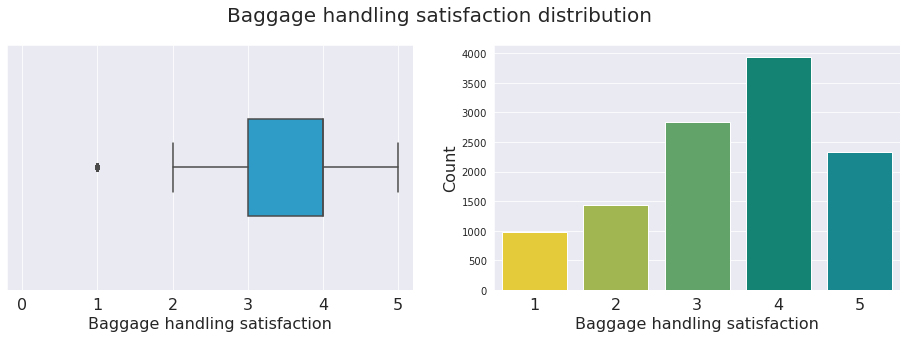

In [26]:
_feat = 'Baggage handling'
df_count = df_final[_feat].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(16, 4.5))
ax1 = sns.barplot(y=df_count, x=df_count.index, palette=_colormap6,
                  ax=axes[1])
ax3 = sns.boxplot(df_final[_feat], ax=axes[0], 
                  color='#15A7E0', width=0.4)
ax1.set_ylabel('Count', size=16)
ax1.set_xlabel(f'{_feat} satisfaction', size=16)
ax3.set_xlabel(f'{_feat} satisfaction', size=16)
ax1.tick_params(axis='x', which='major', labelsize=16)
ax3.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle(f'{_feat} satisfaction distribution',
             fontsize=20, y=1)
ax3.set_xlim(xmin=-0.2)
plt.show()

<center>Figures 36 and 37. Baggage handling satisfaction boxplot and distribution among air passengers</center>

The majority of passengers **rated check-in services well**. This insight is great news for airlines! This shows that airlines are doing a good job of providing efficient and convenient check-in options to their passengers. By providing hassle-free and convenient check-in services, airlines can enhance the overall travel experience for passengers, reduce stress and inconvenience, and potentially stand out in the competitive market. After all, no one wants to deal with long queues and complicated check-in procedures. When passengers feel happy and satisfied with their check-in experience, they're more likely to have a positive impression of the airline and choose them for future travel needs.

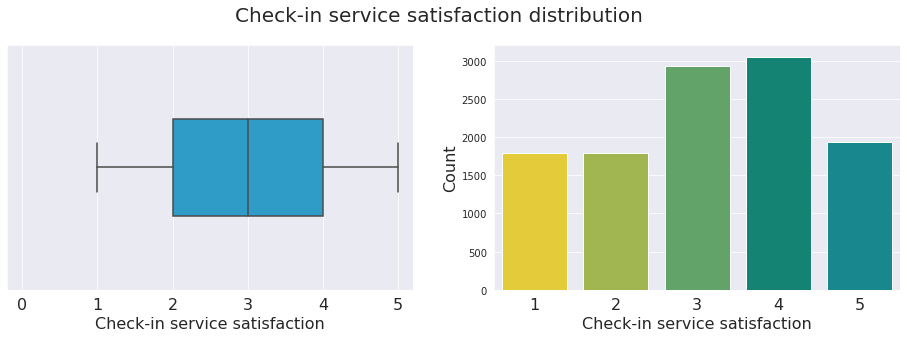

In [27]:
_feat = 'Checkin service'
df_count = df_final[_feat].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(16, 4.5))
ax1 = sns.barplot(y=df_count, x=df_count.index, palette=_colormap6,
                  ax=axes[1])
ax3 = sns.boxplot(df_final[_feat], ax=axes[0], 
                  color='#15A7E0', width=0.4)
ax1.set_ylabel('Count', size=16)
ax1.set_xlabel(f'Check-in service satisfaction', size=16)
ax3.set_xlabel(f'Check-in service satisfaction', size=16)
ax1.tick_params(axis='x', which='major', labelsize=16)
ax3.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle(f'Check-in service satisfaction distribution',
             fontsize=20, y=1)
ax3.set_xlim(xmin=-0.2)
plt.show()

<center>Figures 38 and 39. Check-in service satisfaction boxplot and distribution among air passengers</center>

Majority of passengers **in-flight services well**. This is a promising insight for airlines! The fact that most passengers rated in-flight services well indicates that airlines are doing a good job of providing high-quality services to their customers. This highlights the importance of prioritizing providing passengers an enjoyable and relaxing in-flight experience.
When combined with earlier insights, such as the mixed feelings about in-flight Wi-Fi and the need for seamless and efficient check-in processes, it's clear that airlines need to focus on multiple aspects of the travel experience to maintain high levels of customer satisfaction.

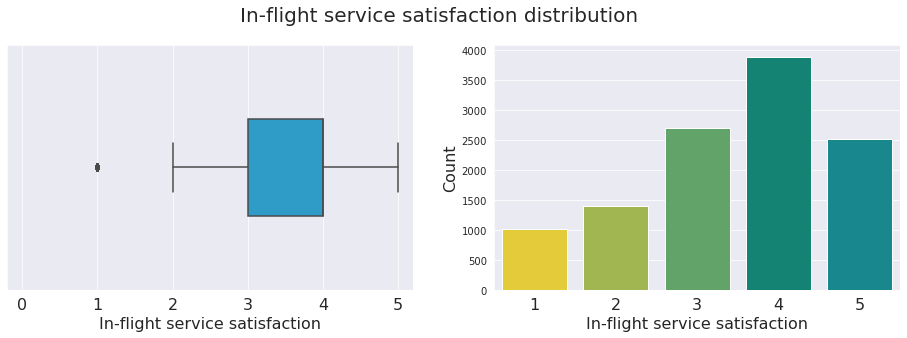

In [28]:
_feat = 'Inflight service'
df_count = df_final[_feat].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(16, 4.5))
ax1 = sns.barplot(y=df_count, x=df_count.index, palette=_colormap6,
                  ax=axes[1])
ax3 = sns.boxplot(df_final[_feat], ax=axes[0], 
                  color='#15A7E0', width=0.4)
ax1.set_ylabel('Count', size=16)
ax1.set_xlabel(f'In-flight service satisfaction', size=16)
ax3.set_xlabel(f'In-flight service satisfaction', size=16)
ax1.tick_params(axis='x', which='major', labelsize=16)
ax3.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle(f'In-flight service satisfaction distribution',
             fontsize=20, y=1)
ax3.set_xlim(xmin=-0.2)
plt.show()

<center>Figures 40 and 41. In-flight service satisfaction boxplot and distribution among air passengers</center>

Passengers have **mixed feelings about in-flight cleanliness**. This may imply that some passengers feel that airplanes are not always as clean as they would like. As such, airlines need to do a better job of keeping their planes clean throughout the entire flight. While some passengers might be okay with the cleanliness of their flight, others think there is room for improvement to ensure the flight is both comfortable and safe.

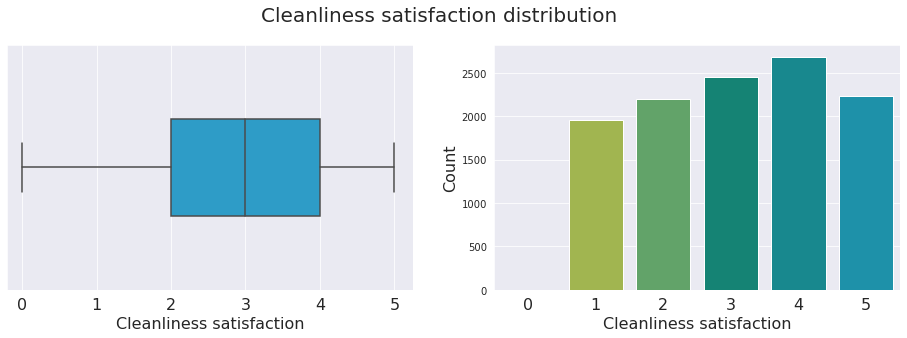

In [29]:
_feat = 'Cleanliness'
df_count = df_final[_feat].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(16, 4.5))
ax1 = sns.barplot(y=df_count, x=df_count.index, palette=_colormap6,
                  ax=axes[1])
ax3 = sns.boxplot(df_final[_feat], ax=axes[0], 
                  color='#15A7E0', width=0.4)
ax1.set_ylabel('Count', size=16)
ax1.set_xlabel(f'{_feat} satisfaction', size=16)
ax3.set_xlabel(f'{_feat} satisfaction', size=16)
ax1.tick_params(axis='x', which='major', labelsize=16)
ax3.tick_params(axis='x', which='major', labelsize=16)
fig.suptitle(f'{_feat} satisfaction distribution',
             fontsize=20, y=1)
ax3.set_xlim(xmin=-0.2)
plt.show()

<center>Figures 42 and 43. Cleanliness satisfaction boxplot and distribution among air passengers</center>

**Cleanliness, food and drink, seat comfort, and in-flight entertainment are highly correlated** with one another. This implies that a bad experience in one of these factors negatively affects the experience in the other factors. For example, cleanliness can affect seat comfort, which in turn can affect the eating/drinking experience, which in turn diminishes your enjoyment of in-flight entertainment. 

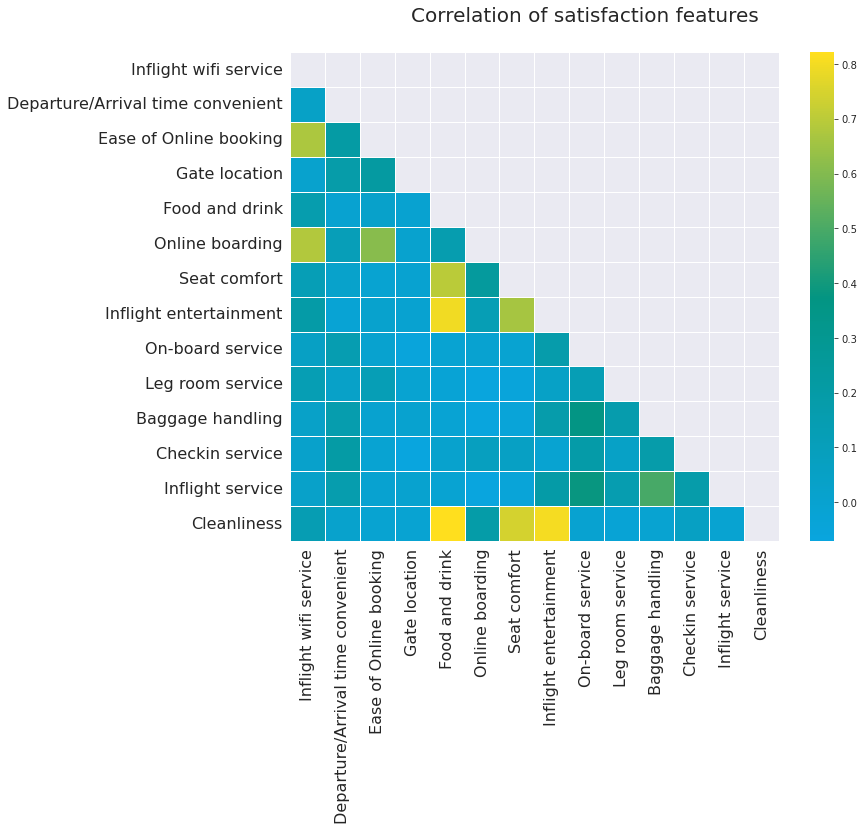

In [30]:
for_heatmap = ['Inflight wifi service', 'Departure/Arrival time convenient',
       'Ease of Online booking', 'Gate location', 'Food and drink',
       'Online boarding', 'Seat comfort', 'Inflight entertainment',
       'On-board service', 'Leg room service', 'Baggage handling',
       'Checkin service', 'Inflight service', 'Cleanliness']

corr = df_final[for_heatmap].corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

fig, ax = plt.subplots(figsize=(11, 9))
ax1 = sns.heatmap(corr, mask=mask, square=True,
            linewidths=.5, ax=ax, cmap=get_RGB(255)[::-1])
ax1.tick_params(axis='both', which='major', labelsize=16)
fig.suptitle(f'Correlation of satisfaction features',
             fontsize=20, y=0.95)
plt.show()

<center>Figure 44. Correlation plot heatmat of satisfaction features.</center>

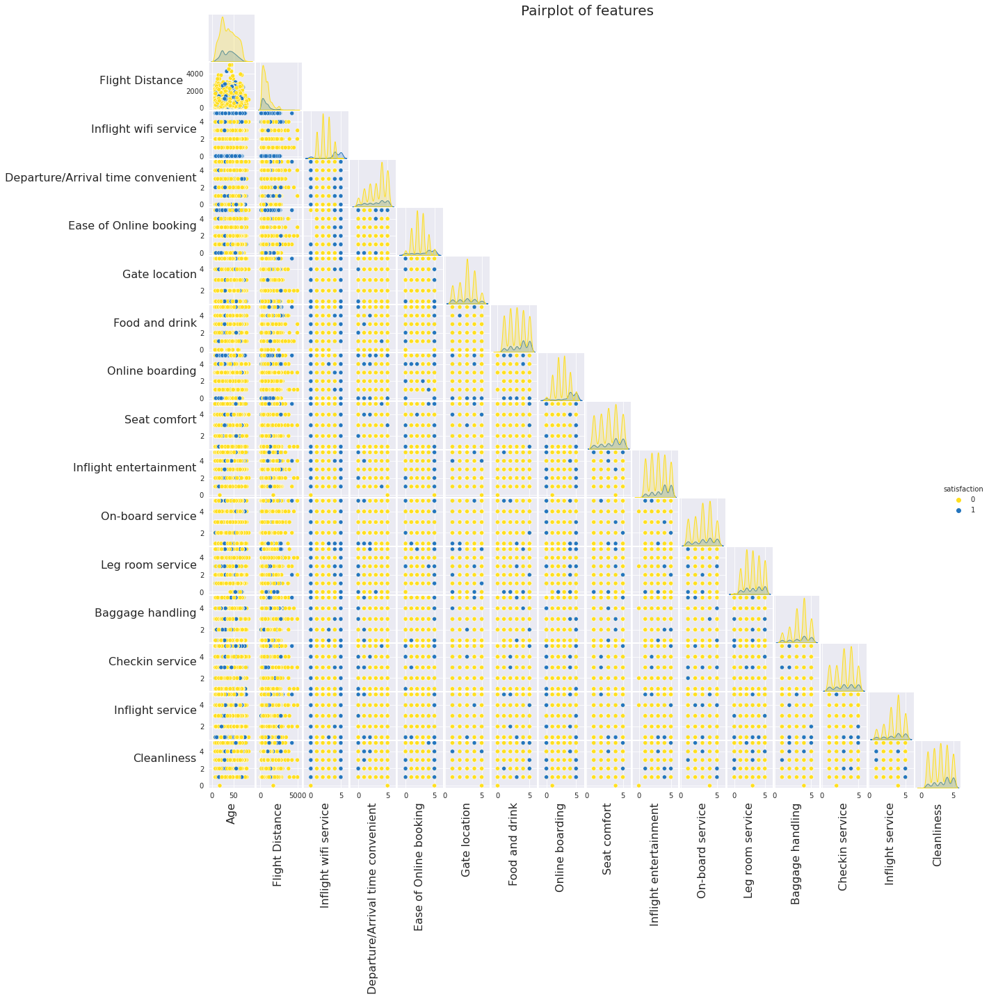

In [31]:
for_pairplot = ['Customer Type', 'Age', 'Type of Travel', 'Flight Distance',
                'Inflight wifi service', 'Departure/Arrival time convenient',
                'Ease of Online booking', 'Gate location', 'Food and drink',
                'Online boarding', 'Seat comfort', 'Inflight entertainment',
                'On-board service', 'Leg room service', 'Baggage handling',
                'Checkin service', 'Inflight service', 'Cleanliness',
                'satisfaction']

corr = df_final[for_pairplot]
ax = sns.pairplot(corr, corner=True, palette=['#ffdf1e', '#2475be'], 
                  hue='satisfaction')
for axes in ax.axes.flat:
    try:
        axes.set_ylabel(axes.get_ylabel(), rotation=0, ha='right', size=16)
    except:
        pass
    try:
        axes.set_xlabel(axes.get_xlabel(), rotation=90, ha='center', size=16)
    except:
        pass
ax.fig.suptitle(f'Pairplot of features',
             fontsize=20, y=1)
plt.gcf().set_size_inches(16, 16)
plt.show()

<center>Figure 45. Pairplot of satisfaction features.</center>

# MACHINE LEARNING

## Train-Test Split


In [32]:
# split features and target
X, y = df_final.drop('satisfaction', axis=1), df_final['satisfaction'] # Edit according to target feature name

# train-test split
X_trainval, X_test, y_trainval, y_test = train_test_split(X, y,
                                                    random_state=1, 
                                                    test_size=0.25,
                                                    stratify=y)

## GridSearch

In [33]:
grid_search = None

pipe = Pipeline([
    ('classifier', None)
])

params = [
    {
        'classifier': [ExplainableBoostingClassifier(random_state=1337, n_jobs=-1)],
        'classifier__max_leaves': [3, 4, 5],
        'classifier__learning_rate': [0.2, 0.3, 0.4, 0.5]
    }
]

# Perform the grid search
grid_search = GridSearchCV(pipe, params, cv=5, scoring='f1')
grid_search.fit(X_trainval, y_trainval)

print(grid_search.best_params_)
print(grid_search.best_score_)

{'classifier': ExplainableBoostingClassifier(learning_rate=0.3, max_leaves=4, n_jobs=-1,
                              random_state=1337), 'classifier__learning_rate': 0.3, 'classifier__max_leaves': 4}
0.8301121340883342


## Cross-Validation

In [34]:
resampling_pipe = Pipeline([ ('resampler', SMOTENC(categorical_features=[0,1,3], random_state=143)),
                             ('ExplainableBoostingClassifier', 
                              ExplainableBoostingClassifier(max_leaves=4, learning_rate=0.3,
                                                            random_state=1337, n_jobs=-1))])

res = {}
skf = StratifiedKFold(n_splits=10)


train_acc_scores = []
train_pre_scores = []
train_rec_scores = []
train_f1_scores = []
val_acc_scores = []
val_pre_scores = []
val_rec_scores = []
val_f1_scores = []

for train_index, val_index in skf.split(X_trainval, y_trainval):
    X_train, X_val = X_trainval.iloc[train_index], X_trainval.iloc[val_index]
    y_train, y_val = y_trainval.iloc[train_index], y_trainval.iloc[val_index]

    pipeline = resampling_pipe

    #fit
    pipeline.fit(X_train, y_train)

    #predict
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)

    train_pre_scores.append(precision_score(y_train, train_preds))
    train_acc_scores.append(accuracy_score(y_train, train_preds))
    train_rec_scores.append(recall_score(y_train, train_preds))
    train_f1_scores.append(f1_score(y_train, train_preds))
    val_pre_scores.append(precision_score(y_val, val_preds))
    val_acc_scores.append(accuracy_score(y_val, val_preds))
    val_rec_scores.append(recall_score(y_val, val_preds))
    val_f1_scores.append(f1_score(y_val, val_preds))

res['ExplainableBoostingClassifier'] = {
    'train_accuracy': np.mean(train_acc_scores) * 100,
    'val_accuracy': np.mean(val_acc_scores) * 100,
    'train_precision': np.mean(train_pre_scores) * 100,
    'val_precision':np.mean(val_pre_scores) * 100,
    'train_recall': np.mean(train_rec_scores) * 100,
    'val_recall':np.mean(val_rec_scores) * 100,
    'train_f1': np.mean(train_f1_scores) * 100,
    'val_f1':np.mean(val_f1_scores) * 100,
}


results_df = pd.DataFrame(res).T
results_df

,train_accuracy,train_f1,train_precision,train_recall,val_accuracy,val_f1,val_precision,val_recall
ExplainableBoostingClassifier,92.700578,82.517146,76.925409,88.988542,90.570756,77.573871,71.976348,84.223339


In [35]:
X_train, y_train = X_trainval, y_trainval

# optimal model
ebm_opt = Pipeline([('resampler', SMOTENC(categorical_features=[0,1,3], random_state=143)),
                        ('ExplainableBoostingClassifier', 
                         ExplainableBoostingClassifier(random_state=1337,
                                                       n_jobs=-1, max_leaves=4, learning_rate=0.3))])
ebm_opt.fit(X_train, y_train)

# predict
y_train_pred = ebm_opt.predict(X_train)
y_test_pred = ebm_opt.predict(X_test)

# train and test scores
summary = {'train_acc': accuracy_score(y_train, y_train_pred),
            'train_f1': f1_score(y_train, y_train_pred),
           'train_prec': precision_score(y_train, y_train_pred),
           'train_recall': recall_score(y_train, y_train_pred),
           'test_acc': accuracy_score(y_test, y_test_pred),
           'test_f1': f1_score(y_test, y_test_pred),
           'test_prec': precision_score(y_test, y_test_pred),
           'test_recall': recall_score(y_test, y_test_pred)
           }
           

pd.DataFrame(summary, index=['ebm'])

,train_acc,train_f1,train_prec,train_recall,test_acc,test_f1,test_prec,test_recall
ebm,0.928497,0.829376,0.770652,0.897788,0.908365,0.78,0.728972,0.83871


# EXPLAINABILITY

## EBM Global Explanation

In [36]:
ebm_opt = ExplainableBoostingClassifier(random_state=1337, n_jobs=-1, max_leaves=4, learning_rate=0.3,)
ebm_opt.fit(X, y)
ebm_global = ebm_opt.explain_global()
show(ebm_global)

## EBM Local Explanation

In [37]:
ebm_local = ebm_opt.explain_local(X_test[:1000], y_test[:1000])
show(ebm_local)

## Diverse Counterfactual Explanations

In [38]:
gender_map = {'Female':0,
              'Male':1}

customer_map = {'disloyal Customer':0,
               'Loyal Customer':1}

type_map = {'Personal Travel':0,
            'Business travel':1}

type_map = {'Personal Travel':0,
            'Business travel':1}

df = df_final.replace({'Gender': gender_map,
                 'Customer Type': customer_map,
                 'Type of Travel': type_map})

df

,Gender,Customer Type,Age,Type of Travel,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
id,,,,,,,,,,,,,,,,,,,,,,
19556,0,1,52,1,160,5,4,3,4,3,4,3,5,5,5,5,2,5,5,50,44.0,1
12360,1,0,20,1,192,2,0,2,4,2,2,2,2,4,1,3,2,2,2,0,0.0,0
36875,0,1,49,1,1182,2,3,4,3,4,1,2,2,2,2,2,4,2,4,0,20.0,1
39177,1,1,16,1,311,3,3,3,3,5,5,3,5,4,3,1,1,2,5,0,0.0,1
27508,1,1,47,1,556,5,2,2,2,5,5,5,5,2,2,5,3,3,5,1,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30263,1,0,42,1,1024,4,4,4,2,3,4,3,3,3,1,2,2,3,3,0,17.0,0
86816,1,1,41,1,692,2,2,2,2,2,2,2,2,2,3,3,2,3,2,15,3.0,0
25309,0,0,36,1,432,1,5,1,3,4,1,4,4,5,2,5,2,3,4,0,0.0,0


In [39]:
# split features and target
X, y = df.drop('satisfaction', axis=1), df['satisfaction'] # Edit according to target feature name

# train-test split
X_trainval, X_test, y_trainval, y_test = train_test_split(X, y,
                                                    random_state=1, 
                                                    test_size=0.25,
                                                    stratify=y)

In [40]:
X_train, y_train = X_trainval, y_trainval

# optimal model
ebm_opt = Pipeline([('resampler', SMOTENC(categorical_features=[0,1,3], random_state=143)),
                        ('ExplainableBoostingClassifier', 
                         ExplainableBoostingClassifier(random_state=1337,
                                                       n_jobs=-1, max_leaves=4, learning_rate=0.3))])

ebm_opt.fit(X_train, y_train)

# predict
y_train_pred = ebm_opt.predict(X_train)
y_test_pred = ebm_opt.predict(X_test)

# train and test scores
summary = {'train_acc': accuracy_score(y_train, y_train_pred),
            'train_f1': f1_score(y_train, y_train_pred),
           'train_prec': precision_score(y_train, y_train_pred),
           'train_recall': recall_score(y_train, y_train_pred),
           'test_acc': accuracy_score(y_test, y_test_pred),
           'test_f1': f1_score(y_test, y_test_pred),
           'test_prec': precision_score(y_test, y_test_pred),
           'test_recall': recall_score(y_test, y_test_pred)
           }
           

pd.DataFrame(summary, index=['ebm'])

,train_acc,train_f1,train_prec,train_recall,test_acc,test_f1,test_prec,test_recall
ebm,0.928497,0.829376,0.770652,0.897788,0.908365,0.78,0.728972,0.83871


In [41]:
dice_data = dice_ml.Data(dataframe=df,
                         continuous_features=df.columns.tolist()[:-1],
                         outcome_name='satisfaction')

dice_model = dice_ml.Model(model=ebm_opt, backend='sklearn')

dice_explainer = dice_ml.Dice(dice_data, dice_model, method='genetic')

In [42]:
passenger_0 = X_test.iloc[[0]]
passenger_0

,Gender,Customer Type,Age,Type of Travel,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
id,,,,,,,,,,,,,,,,,,,,,
115731,0,1,44,1,446,3,4,4,4,5,2,2,3,3,3,3,3,3,1,1,0.0


In [43]:
dice_explanation = dice_explainer.generate_counterfactuals(
    passenger_0,
    total_CFs=5,
    desired_class="opposite",
    features_to_vary=['Customer Type', 'Type of Travel',
                      'Inflight wifi service', 'Departure/Arrival time convenient',
                      'Ease of Online booking', 'Gate location', 'Food and drink',
                      'Online boarding', 'Seat comfort', 'Inflight entertainment',
                      'On-board service', 'Leg room service', 'Baggage handling',
                      'Checkin service', 'Inflight service', 'Cleanliness'],
    initialization="random"
)

dice_explanation.visualize_as_dataframe(show_only_changes=True)

100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

Query instance (original outcome : 1)


,Gender,Customer Type,Age,Type of Travel,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0.0,1.0,44.0,1.0,446.0,3.0,4.0,4.0,4.0,5.0,2.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,1.0,1.0,0.0,1



Diverse Counterfactual set (new outcome: 0)


,Gender,Customer Type,Age,Type of Travel,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,-,-,-,-,-,1.0,-,-,-,0.0,3.0,-,5.0,-,5.0,-,4.0,4.0,2.0,-,-,0.0
0,-,-,-,-,-,-,2.0,-,-,4.0,-,5.0,5.0,-,4.0,5.0,1.0,4.0,4.0,-,-,0.0
0,-,-,-,-,-,1.0,1.0,3.0,-,-,3.0,1.0,5.0,4.0,4.0,2.0,-,2.0,-,-,-,0.0
0,-,-,-,-,-,4.0,1.0,-,-,0.0,4.0,-,4.0,4.0,5.0,-,1.0,-,3.0,-,-,0.0
0,-,-,-,-,-,2.0,-,1.0,5.0,3.0,3.0,-,1.0,-,4.0,-,4.0,1.0,0.0,-,-,0.0


# Results & Discussions

Using SMOTENC as the oversampling algorithm to handle class imbalance, and Explainable Boosting Machine as our classifier and explainability model, we are able to get the following performance metrics. 

|<center>Metric</center>|<center>Value</center>|
|:-------------------|:----------------------|
| Train Accuracy | 0.928497 |
| Train F1-score | 0.829376 |
| Train Precision | 0.770652 |
| Train Recall | 0.897788 |
| Test Accuracy | 0.908365 |
| Test F1-score | 0.78 |
| Test Precision | 0.728972 |
| Test Recall | 0.83871 |

Since our **accuracy is greater than 1.25PCC = 0.8625**, we can proceed with looking at the feature importance pots of Explainable Boosting Machine. 

Looking at the Explainable Boosting Machine global explanation, we see that the top features affecting clustomer satisfaction are the following:
* **In-flight wifi service** 
* **Type of travel, and** 
* **Customer type.** 

Let us zone in on those top predictors. For wi-fi service, notice that the 1-star to 3-star ratings were negatively scored while 4-star and 5-star ratings were positively scored. Positive scores imply a positive contribution to customer satisfaction. It is interesting here that there is a rating of 0 for not applicable, and it has an even greater score than a 5-star rating. This implies that it is better not to offer wi-fi on flights. The scores shown by the explanation for in-flight wi-fi service suggest an endowment effect on customers. This means that having no wi-fi at all on flights is much better for customer satisfaction than having lousy wi-fi.

Passengers traveling for business were positively scored, while passengers traveling for personal reasons were negatively scored. This means that business travel contributes positively to customer satisfaction. This suggests that **passengers on personal travel are more discerning** and nitpicky about the inconveniences during their flights. Passengers who travel for business reasons are more likely to be satisfied with their overall experience because these people are not in it for the experience; their main concern is getting to their destination and doing their business.

Similarly, loyal customers were positively scored, while disloyal were negatively scored. **Disloyal customers are more discerning** since they have travel experiences with other airlines, and this means a disloyal passenger can identify which services are sub-standard in their flights. Customers who choose the same airline have nothing to compare their flight experiences with.

We can also look at the local explanation of the Explainable Boosting Machine to see how each feature of a sample passenger contributes to overall satisfaction. We also used Diverse Counterfactual Explanations to identify samples of dissatisfied passengers and provide a sample of the satisfied customer, so we have a point of comparison on which features we can improve to change customers' overall satisfaction. Let us consider Pedro, who is an actual passenger in the dataset. He was dissatisfied with his overall experience, and we highlighted four features that he rated lowly, as shown below. Counterfactuals in this context try to answer the question of **how might the features should change to satisfy Pedro**. The algorithm tells us that if the airline company improves on these four features such that Pedro would give this much of an increase in his ratings, then that would make Pedro satisfied. The algorithm can provide these for any passenger in the dataset.

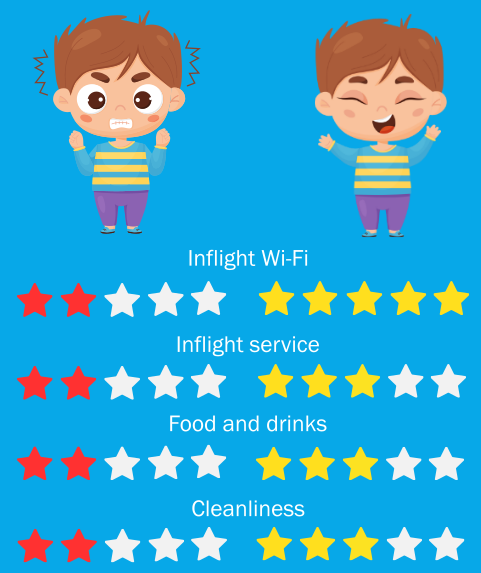

# Conclusion

In this report, the team **successfully identified the top factors contributing to the overall satisfaction of economy-class air passengers** using the Explainable Boosting Machine algorithm. In-flight wi-fi service stood out as the top contributor, followed by the type of travel and customer type. It turned out that if airline companies plan to offer wi-fi, they have to make it good; otherwise, the explainability results suggest that not offering it at all will improve passenger satisfaction. Customers who fly for personal reasons are more critical in their judgment of their overall experience; if travelers are going on a vacation, then the flight itself is part of the vacation, so they are more perceptive in their satisfaction. Finally, loyal customers are more likely to be satisfied. Because they choose the same airline when they fly, loyal customers have nothing to compare their flight experiences with and thus become desensitized to the substandard aspects of their flights.

We have also **provided passenger-level explainability** through the use of Diverse Counterfactual Explanations. This allows airline companies to zone in on a passenger who is always dissatisfied with his flight and make the necessary adjustments to satisfy the passenger on his succeeding flights. 

From these results, we formulate the following recommendations for airline companies:
+ They should double down on their wi-fi services. People love the internet, especially when they have to sit through long flights.
+ They should go the extra mile and not cheap out on tourist destination flights because travelers treat it as part of their vacation experience.
+ Loyalty should be rewarded: they should create better packages for loyalty programs and invest heavily in advertising them. The benefits to the company will outweigh the costs.


# Recommendations

This study could be further improved by the following recommendations:

1. By performing a separate analysis on each travel type(business or personal), we can obtain more granular insights on what each travel type customer finds important for their overall satisfaction.

2. We can try other hyperparameter optimization frameworks for improved performance in runtimes and added visualizations. Some known hyperparameter optimization frameworks are:

    * **Ray-Tune** - a Python library for experiment execution and hyperparameter tuning at any scale.
    * **Optuna** - an automatic hyperparameter optimization software framework, particularly designed for machine learning.
    * **Hyperopt** - a Python library for serial and parallel optimization over awkward search spaces, which may include real-valued, discrete, and conditional dimensions.
    * **mlmachine** - performs Hyperparameter Tuning with Bayesian Optimization on multiple estimators in one shot and includes functionality for visualizing model performance and parameter selections.
    * **Polyaxon** - a platform for building, training, and monitoring large scale deep learning applications. It makes a system to solve reproducibility, automation, and scalability for machine learning applications.
    * **BayesianOptimization** - a constrained global optimization package built upon Bayesian inference and Gaussian process, that attempts to find the maximum value of an unknown function in as few iterations as possible.
    * **Talos** - fully automates hyperparameter tuning and model evaluation in a regular Keras workflow.
    * **SHERPA** - a Python library for hyperparameter tuning of machine learning models.
    * **Scikit-Optimize** - a simple and efficient library to minimize very expensive and noisy black-box functions that implements several methods for sequential model-based optimization. 
    * **GPyOpt** - a tool for optimization of black-box functions using Gaussian processes.
   
   
3. Our successful implementation of EBM for airline satisfaction data is proof that this can also be applied to other industries and businesses that care about customer service satisfaction.

4. Since EBM is a both a prediction model and an explainability model in one, it would be interesting to see the full capabilities of EBM in other datasets especially ones with interacting terms.

5. Since one of our main conclusions is that customer loyalty is an important feature for satisfaction, maybe we could make a separate analysis involving counterfactuals to see what we could change to convert disloyal customers into loyal ones.

# References

[1] Statista (2021). Global air traffic - scheduled flights 2004-2021. Retrieved from https://www.statista.com/statistics/564717/air-traffic-scheduled-flights-worldwide/

[2] Statista (2023). Global air traffic - scheduled flights 2004-2022. Retrieved from https://www.statista.com/statistics/564717/air-traffic-scheduled-flights-worldwide/

[3] International Air Transport Association (IATA). (2021). 2020 Worst Year in History for Air Travel Demand
https://www.iata.org/en/pressroom/pressroom-archive/2021-releases/2021-02-03-02/

[4] Elliott, C. (2020). Surprise! Airline Customer Service Improved In 2020. Here’s Why. Forbes. Retrieved from https://www.forbes.com/sites/christopherelliott/2020/12/16/surprise-airline-customer-service-improved-in-2020-heres-why/?sh=7f4a6d9e5273

[5] InterpretML. (n.d.). Explainable Boosting Machines (EBM). Retrieved March 19, 2023, from https://interpret.ml/docs/ebm.html

[6] Kübler, R. (2021). The Explainable Boosting Machine. Towards Data Science. Retrieved from https://towardsdatascience.com/the-explainable-boosting-machine-f24152509ebb

[7] Oleszak, M. (2022). Explainable Boosting Machines. Towards AI. Retrieved from https://pub.towardsai.net/explainable-boosting-machines-c71b207231b5

[8] InterpretML. (n.d.). InterpretML. GitHub. https://github.com/interpretml/interpret

[9] Nori, H., Jenkins S., Koch P., and Caruana R. (2019) InterpretML: A Unified Framework for Machine Learning Interpretability. https://arxiv.org/pdf/1909.09223.pdf

[10] InterpretML. (n.d.). DiCE: A library for Distribution Counterfactual Explanations. GitHub. https://github.com/interpretml/DiCE

[11] Ramaravind K. Mothilal, Amit Sharma, and Chenhao Tan (2020). Explaining machine learning classifiers through diverse counterfactual explanations. Proceedings of the 2020 Conference on Fairness, Accountability, and Transparency. https://arxiv.org/pdf/1905.07697.pdf

[12] Sugano, Y. (2020). DiCE -ML models with counterfactual explanations for the sunk Titanic. Medium – Where good ideas find you. https://medium.com/analytics-vidhya/dice-ml-models-with-counterfactual-explanations-for-the-sunk-titanic-30aa035056e0

[13] Darshan M. (2022). How to generate counterfactual explanations with DiCE-ML? Machine Hack. https://machinehack.com/story/how-to-generate-counterfactual-explanations-with-dice-ml